# Importing Libraries

In [134]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

import cv2

import os

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix


=========================================================================================================================

# Collecting Data by Camera

In [ ]:
cap = cv2.VideoCapture(0)  #Open The Camera

i=0
while(cap.isOpened()):
    ret, frame = cap.read()   #to Read Each Frame   
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)     # Change BGR to Gray Colormap

    cv2.imshow('frame',frame)
    cv2.imshow('gray',gray)

    if cv2.waitKey(10) & 0xFF == ord('p'):
        i=i+1
        if i==200:
            break

        cv2.imwrite('Train/Five/Five'+ str(i)    +'.jpg',frame)  #Save the Photos
        print(i)

    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
        
cap.release() # Close The Camera

cv2.destroyAllWindows()

=========================================================================================================================

## Reading Images [ From Folders ]

In [10]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        img=cv2.resize(img,(225,225))              # Set whatever size you want 
        img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # to visualize  easier with matplotlib
        if img is not None:
            images.append(img)
    return images

=========================================================================================================================

# Data Augmentaion for All Classes

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\TwoHundred\TwoHundred193.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\TwoHundred',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\OneHundred\OneHundred223.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\OneHundred',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Fifty\Fifty188.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Fifty',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Twenty\Twenty168.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Twenty',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Ten\Ten182.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Ten',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

In [ ]:
datagen = ImageDataGenerator(
    featurewise_center=True,
    rotation_range=70,
    width_shift_range=0.3,
    height_shift_range=0.2,
    horizontal_flip=True)


path_img = "D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Five\Five176.jpg"
img  = load_img(path_img)
img_  = img_to_array(img) 
img_ = img_.reshape((1, ) + img_.shape)
i = 0
for batch in datagen.flow(img_, batch_size = 1, 
                      save_to_dir = 'D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\Train\Five',  
                      save_prefix ='img', save_format ='jpg'):
        i += 1
        if i == 200: 
            break

=========================================================================================================================

# 1. Preparing Training Images

In [149]:
class1=load_images_from_folder('Train/TwoHundred')
print(class1[0].shape)
print(len(class1))

class2=load_images_from_folder('Train/OneHundred')
print(class2[0].shape)
print(len(class2))

class3=load_images_from_folder('Train/Fifty')
print(class3[0].shape)
print(len(class3))

class4=load_images_from_folder('Train/Twenty')
print(class4[0].shape)
print(len(class4))

class5=load_images_from_folder('Train/Ten')
print(class5[0].shape)
print(len(class5))

class6=load_images_from_folder('Train/Five')
print(class6[0].shape)
print(len(class6))

(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
99
(225, 225, 3)
99
(225, 225, 3)
99


In [150]:
X_train=[]
Data=[class1,class2,class3,class4,class5,class6]
for c in Data :
    for i,image in enumerate(c) :
        image=image/255  # Norm   0-1
        X_train.append(image)

In [151]:
labels={
    200:'200',
    100:'100',
    50:'50',
    20:'20',
    10:'10',
    5:'5'
}
y_train=[0]*len(class1)+[1]*len(class2)+[2]*len(class3)+[3]*len(class4)+[4]*len(class5)+[5]*len(class6)

In [152]:
print('Training Images Count :' ,len(X_train),'Training Labels Count:',len(y_train))

Training Images Count : 597 Training Labels Count: 597


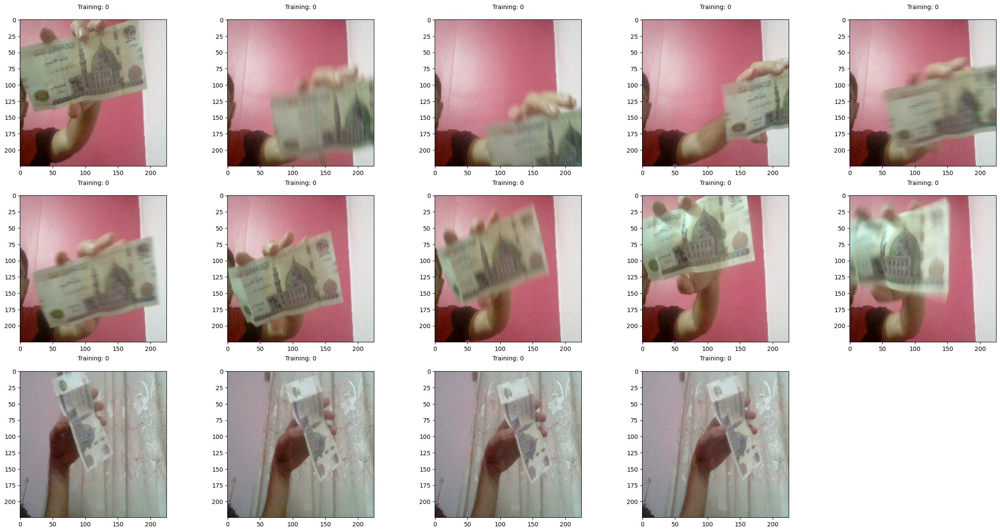

In [153]:
with plt.style.context('default'):
    plt.figure(figsize=(30,15))
    for index, (image, label) in enumerate(zip(X_train[0:14], y_train)):
        plt.subplot(3, 5, index+1)  # visualization  Number or Rows and Columns
        plt.imshow(image, cmap=plt.cm.Blues)
        plt.title("Training: %i\n" %label, fontsize=10)

==================================================================================================================

# 2. Preparing Test Images

In [154]:
class1test=load_images_from_folder('Test/TwoHundred')
print(class1test[0].shape)
print(len(class1test))

class2test=load_images_from_folder('Test/OneHundred')
print(class2test[0].shape)
print(len(class2test))

class3test=load_images_from_folder('Test/Fifty')
print(class3test[0].shape)
print(len(class3test))

class4test=load_images_from_folder('Test/Twenty')
print(class4test[0].shape)
print(len(class4test))

class5test=load_images_from_folder('Test/Ten')
print(class5test[0].shape)
print(len(class5test))

class6test=load_images_from_folder('Test/Five')
print(class6test[0].shape)
print(len(class6test))

(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
100
(225, 225, 3)
100


In [155]:
X_test=[]
Data2=[class1test,class2test,class3test,class4test,class5test,class6test]
for c in Data2 :
    for i,image in enumerate(c) :
        image=image/255  # Norm   0-1
        X_test.append(image)

In [156]:
labels={
    200:'200',
    100:'100',
    50:'50',
    20:'20',
    10:'10',
    5:'5'
}
y_test=[0]*len(class1test)+[1]*len(class2test)+[2]*len(class3test)+[3]*len(class4test)+[4]*len(class5test)+[5]*len(class6test)

In [157]:
print('Testing Images Count :' ,len(X_test),'Testing Labels Count:',len(y_test))

Testing Images Count : 600 Testing Labels Count: 600


==================================================================================================================

#  Building The Model
## Convolutional Neural Network

In [158]:
X_train_=np.asarray(X_train)
X_test_=np.asarray(X_test)
y_train_=np.asarray(y_train)
y_test_=np.asarray(y_test)

In [159]:
# Basic CNN Model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(225, 225, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(6, activation ='softmax'))
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 223, 223, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 24, 24, 64)       

In [160]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(X_train_, y_train_,batch_size= 32, epochs=10, validation_data=(X_test_, y_test_),verbose=1)

Epoch 1/10


c:\Users\omara\anaconda3\lib\site-packages\tensorflow\python\keras\backend.py:4929: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  warnings.warn(


19/19 [==============================] - 24s 1s/step - loss: 1.7964 - accuracy: 0.1876 - val_loss: 1.8628 - val_accuracy: 0.1667
Epoch 2/10
19/19 [==============================] - 22s 1s/step - loss: 1.7456 - accuracy: 0.2496 - val_loss: 1.6330 - val_accuracy: 0.2917
Epoch 3/10
19/19 [==============================] - 22s 1s/step - loss: 1.2540 - accuracy: 0.4891 - val_loss: 1.2279 - val_accuracy: 0.4267
Epoch 4/10
19/19 [==============================] - 22s 1s/step - loss: 0.7328 - accuracy: 0.7186 - val_loss: 0.8906 - val_accuracy: 0.6250
Epoch 5/10
19/19 [==============================] - 22s 1s/step - loss: 0.3714 - accuracy: 0.8593 - val_loss: 0.5743 - val_accuracy: 0.7667
Epoch 6/10
19/19 [==============================] - 22s 1s/step - loss: 0.1304 - accuracy: 0.9548 - val_loss: 0.6454 - val_accuracy: 0.7867
Epoch 7/10
19/19 [==============================] - 22s 1s/step - loss: 0.0633 - accuracy: 0.9782 - val_loss: 0.6854 - val_accuracy: 0.7483
Epoch 8/10
19/19 [=============

In [161]:
y_pred=model.predict(X_test_)


In [162]:
P=np.argmax(np.round(y_pred), axis=1)
P

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 0, 4, 4, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 4, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 5,

==================================================================================================================

# Model Evaulation 

In [163]:
test_loss , test_acc = model.evaluate(X_test_,y_test_,verbose=2)
print("Test Accuracy: ", test_acc*100 , "%")

19/19 - 5s - loss: 0.6157 - accuracy: 0.8183
Test Accuracy:  81.83333277702332 %


In [164]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

19/19 - 5s - loss: 0.6157 - accuracy: 0.8183


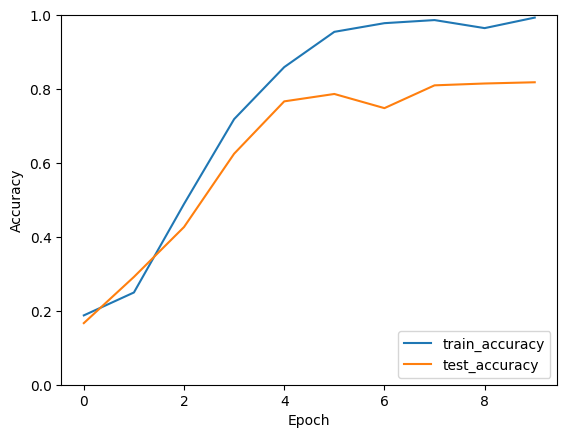

In [165]:
with plt.style.context('default'): 
    plt.plot(history.history['accuracy'], label='train_accuracy')
    plt.plot(history.history['val_accuracy'], label = 'test_accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim([0, 1])
    plt.legend(loc='lower right')
    test_loss, test_acc = model.evaluate(X_test_,  y_test_, verbose=2)

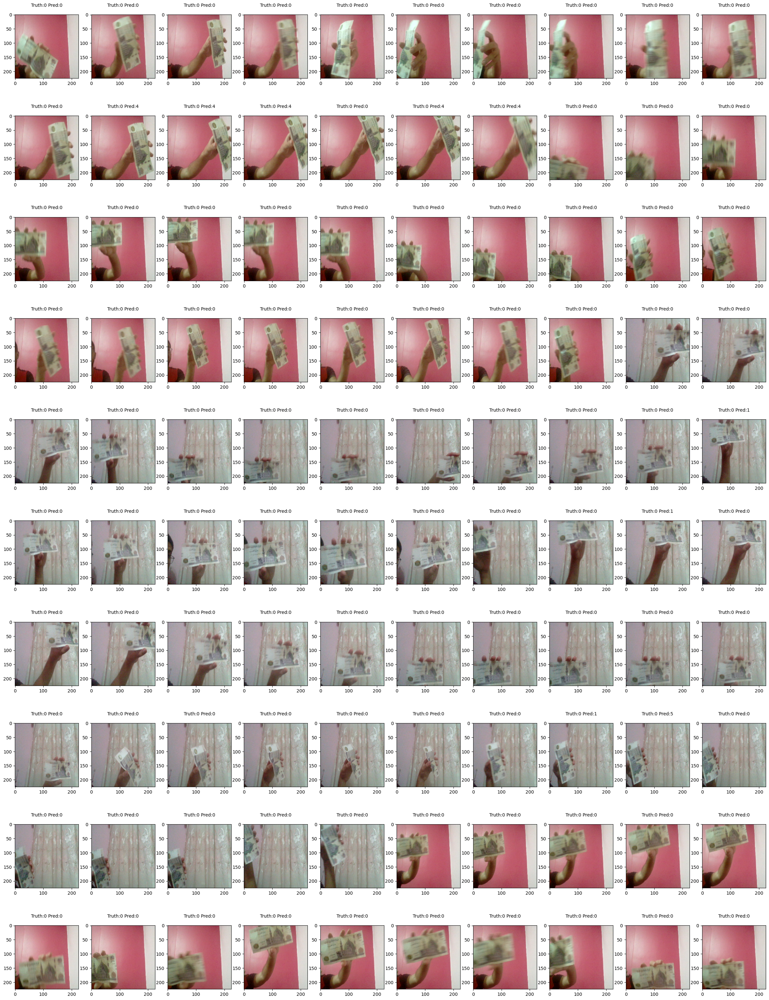

In [166]:
with plt.style.context('default'):
 plt.figure(figsize=(30,40))
 for index, (image, label ,pred ) in enumerate(zip(X_test, y_test,P)):
   try:
    plt.subplot(10, 10, index+1)
    plt.imshow(image, cmap=plt.cm.Blues)
    plt.title("Truth:"+ str(label) + " Pred:"+str(pred) +"\n",fontsize=10)
   except ValueError:
      break

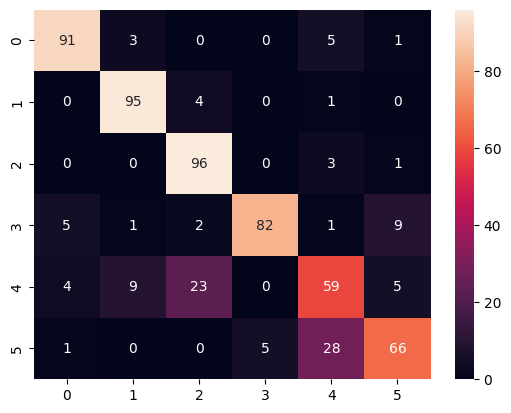

In [168]:
cm = confusion_matrix(y_test,P)

with plt.style.context('default'):
 sns.heatmap(cm , annot= True)

======================================================================================================================

# Live Money Classification

In [87]:
video_capture = cv2.VideoCapture(0)  # webcamera

if not video_capture.isOpened():
    print("Unable to access the camera")
else:
    print("Access to the camera was successfully obtained")

print("Streaming started")


font_scale = 3
font = cv2.FONT_HERSHEY_PLAIN
while True:
    # Capture frame-by-frame
    ret, frame = video_capture.read()
    #f = frame.reshape(1,255,255,3)
    #image_np = np.array(frame)
    f=cv2.resize(frame,(225,225)) 
    f1 = f.reshape(1,225,225,3)

    #frame1.reshape(1,255,255,3)
    predictions = model.predict(f1)


  
    
    cv2.imshow("oBJECT detector - to quit press ESC", frame)

    
    key = cv2.waitKey(1)
    if key % 256 == 27: # ESC code
        break
    
video_capture.release()
cv2.destroyAllWindows()
print("Streaming ended")

Access to the camera was successfully obtained
Streaming started
Streaming ended


====================================================================================================================

# Saving Model

In [169]:
model.save('D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections')

INFO:tensorflow:Assets written to: D:\Courses and Projects\All Projects\Deep Learning Projects\Egyption Money Detections\assets
